# Análise de MCMV

In [4]:
# Importando bibliotecas

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

##### Algumas perguntas

###### Financiamento
- quais estados com maior numero de financiamento? txt_uf x qtd_uh
- quais cidades com maior numero de financiamento? txt_mun x qtd_uh
- quais estados com menor numero de financiamento? txt_uf x qtd_uh
- quais cidades com menor numero de financiamento? txt_mun x qtd_uh
- quais estados com numero de financiamento mais caros? txt_uf x vlr_fina
- quais cidades com numero de financiamento mais caros? txt_mun x vlr_fina
- quais estados com numero de financiamento mais baratos? txt_uf x vlr_fina
- quais cidades com numero de financiamento mais baratos? txt_mun x vlr_fina

###### Subsidios

- quais estados com numero de subsidios mais baixos? txt_uf x vlr_subs
- quais estados com numero de subsidios mais altos? txt_uf x vlr_subs
- quais cidades com numero de subsidios mais caros? txt_mun x vlr_subs
- quais cidades com numero de subsidios mais baixos? txt_mun x vlr_subs

- quantidade de subsidio é diretamente proporcional a quantidade de casas? qtd_uh x vlr_subs

###### Temporal

- compra de casas ao longo dos anos
- compra de casas ao longo dos anos (por estado)

###### Afunilar os dados para a baixada santista

- comparação com o restante do Brasil e SP


In [5]:
# Importando o Dataframe
path = "C:/Users/path/"  #definindo o caminho
df = pd.read_csv(path + "mcmv_financiado_fgts.csv", sep=';') #atribuindo o dataframe para a variavel df com os separadores ;

In [42]:
df.head(10) #visualização das 10 primeiras linhas do df

,txt_municipio,txt_uf,num_ano_financiamento,qtd_uh_financiadas,vlr_financiamento,vlr_subsidio
0,Abadia de Goiás,GO,2009,4,199240.00,46802.09
1,Abadia de Goiás,GO,2010,9,489194.29,151253.00
2,Abadia de Goiás,GO,2011,15,984921.13,139322.99
3,Abadia de Goiás,GO,2012,11,889737.90,205832.32
4,Abadia de Goiás,GO,2013,10,959346.89,156336.89
5,Abadia de Goiás,GO,2014,12,1154569.79,217680.92
6,Abadia de Goiás,GO,2015,15,1607099.15,254939.85
7,Abadia de Goiás,GO,2016,14,1458882.32,219517.03
8,Abadia de Goiás,GO,2017,8,938569.19,150234.44
9,Abadia de Goiás,GO,2018,9,1023798.98,124757.51


In [ ]:
df.shape #retorna as linhas e colunas do df

In [ ]:
df.info() #retorna a estrutura do df de forma completa

In [29]:
colunas = list(df.columns) #lista os nomes das colunas
print(colunas)
df.dtypes #retorna os tipos de dados de cada coluna

['txt_municipio', 'txt_uf', 'num_ano_financiamento', 'qtd_uh_financiadas', 'vlr_financiamento', 'vlr_subsidio']


txt_municipio             object
txt_uf                    object
num_ano_financiamento      int64
qtd_uh_financiadas         int32
vlr_financiamento        float64
vlr_subsidio             float64
dtype: object

In [7]:
#limpar os espaços em branco dos nomes das colunas
df.columns = df.columns.str.strip() 

#### Como a numeração lida pelo pandas é o padrão EUA que lê . como separação decimal e os dados que temos são BR e possuem . como separação de milhar, é necessária a remoção dos . e a alteração das , por .

In [8]:
# Limpar a coluna 'qtd_uh_financiadas'
df['qtd_uh_financiadas'] = df['qtd_uh_financiadas'].astype(str).str.replace('.', '', regex=True)
    
# Limpar as colunas 'vlr_financiamento' e 'vlr_subsidio'
for coluna in ['vlr_financiamento', 'vlr_subsidio']:
    # Remover os pontos ('.')
    df[coluna] = df[coluna].astype(str).str.replace('.', '', regex=True)
    # Substituir as vírgulas (',') por pontos ('.')
    df[coluna] = df[coluna].astype(str).str.replace(',', '.', regex=True)

In [22]:
#converte a columa num_ano para o tipo datetime e deixa so o ano
df['num_ano_financiamento'] = pd.to_datetime(df['num_ano_financiamento'], format='%Y') 
df['num_ano_financiamento'] = df['num_ano_financiamento'].dt.year

# Converter a coluna qtd_uh_financiadas de object para int
df['qtd_uh_financiadas'] = df['qtd_uh_financiadas'].astype(int)

# Converter a coluna vlr_financiamento e vlr_subsidio de object para float64
df['vlr_financiamento'] = pd.to_numeric(df['vlr_financiamento'], errors='coerce')
df['vlr_subsidio'] = pd.to_numeric(df['vlr_subsidio'], errors='coerce')

#ou df['vlr_subsidio'] = pd.to_numeric(df['vlr_subsidio'], errors='coerce', downcast='float')

In [10]:
# Verifique o tipo de dados das coluna
print(df.dtypes)

txt_municipio                    object
txt_uf                           object
num_ano_financiamento    datetime64[ns]
qtd_uh_financiadas                int32
vlr_financiamento               float64
vlr_subsidio                    float64
dtype: object


In [14]:
print(df['txt_uf'].unique())  #visualiza os valores unicos de determinada coluna

['GO' 'MG' 'PA' 'BA' 'PR' 'SC' 'PE' 'TO' 'MA' 'CE' 'RN' 'RS' 'MT' 'AC'
 'SP' 'ES' 'PI' 'AL' 'MS' 'PB' 'RO' 'AM' 'SE' 'RJ' 'RR' 'DF' 'AP']


In [12]:
df.describe(include='all').T #lista algumas caracteristicas do df, como count, unique, max, min e media

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
txt_municipio,53398,4814,Bom Jesus,61,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
txt_uf,53397,27,SP,8321,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_ano_financiamento,53397,15,2014-01-01 00:00:00,4006,2009-01-01,2023-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
qtd_uh_financiadas,53398.0,NaN,NaN,NaN,NaT,NaT,219.742762,25394.132427,1.0,3.0,11.0,48.0,5866912.0
vlr_financiamento,53398.0,NaN,NaN,NaN,NaT,NaT,20739014.243782,2397050494.41628,1500.0,179818.53,729594.145,3471702.24,553710941294.73999
vlr_subsidio,51443.0,NaN,NaN,NaN,NaT,NaT,4393885.501288,498377143.7301,301.0,39008.0,171518.68,841349.66,113017325921.410004


In [15]:
# Selecionar a linha com 'Total Geral' na coluna 'txt_uf'
linha_total_geral = df[df['txt_uf'] == 'Total Geral']

# Imprimir a linha
print(linha_total_geral)

# Remover linhas com NaN apenas na coluna 'txt_uf'
df = df.dropna(subset=['txt_uf'])

Empty DataFrame
Columns: [txt_municipio, txt_uf, num_ano_financiamento, qtd_uh_financiadas, vlr_financiamento, vlr_subsidio]
Index: []


# 1. Qual a UF tem a maior média de valor de financiamento

In [43]:
#Função para agrupar a coluna "txt_uf" e a "vlr_financiamento" para ter a sua media por Estado, e organizando de forma decrescente
#df.groupby("txt_uf")["vlr_financiamento"].mean().sort_values(ascending=False)

# Agrupar por UF e calcular a média do valor de financiamento
df_media_uf = df.groupby('txt_uf')['vlr_financiamento'].mean().reset_index()

# Encontrar a UF com a maior média
uf_maior_media = df_media_uf.loc[df_media_uf['vlr_financiamento'].idxmax()]['txt_uf']

# Criar o gráfico de barras usando Plotly Express
fig = px.bar(df_media_uf, x='txt_uf', y='vlr_financiamento',
            title='Média do Valor de Financiamento por UF',
            labels={'txt_uf': 'UF', 'vlr_financiamento': 'Média do Valor de Financiamento'})

# Adicionar uma linha destacando a UF com a maior média
fig.add_vline(x=uf_maior_media, line_width=2, line_color="red", line_dash="dash")

# Ajustar a disposição das labels no eixo x para evitar sobreposição
fig.update_layout(xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()

In [ ]:
# 1. Análise Geográfica: Distribuição do Financiamento por Estado

# Agrupar os dados por estado e calcular o total de financiamento por estado
financiamento_por_estado = df.groupby('txt_uf')['vlr_financiamento'].sum().sort_values(ascending=False)

# Criar um gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(financiamento_por_estado.index, financiamento_por_estado.values)
plt.xlabel('Estado')
plt.ylabel('Valor Total de Financiamento')
plt.title('Distribuição do Financiamento por Estado')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# 2. Análise Temporal: Evolução do Financiamento ao Longo dos Anos

# Agrupar os dados por ano e calcular o número total de unidades financiadas por ano
unidades_por_ano = df.groupby('num_ano_financiamento')['qtd_uh_financiadas'].sum()

# Criar um gráfico de linha
plt.figure(figsize=(10, 6))
plt.plot(unidades_por_ano.index, unidades_por_ano.values)
plt.xlabel('Ano')
plt.ylabel('Número de Unidades Financiadas')
plt.title('Evolução do Financiamento ao Longo dos Anos')
plt.show()

In [17]:
# Agrupar os dados por ano e calcular o número total de unidades financiadas por ano
unidades_por_ano = df.groupby('num_ano_financiamento')['qtd_uh_financiadas'].sum()

# Criar um gráfico de linhas com Plotly
fig = px.line(
    x=unidades_por_ano.index,
    y=unidades_por_ano.values,
    labels={"x": "Ano", "y": "Número de Unidades Financiadas"},
    title="Evolução do Financiamento ao Longo dos Anos",
)
fig.show()

In [44]:
# Agrupar os dados por ano e UF, e somar o número de unidades financiadas
unidades_por_ano_uf = df.groupby(['num_ano_financiamento', 'txt_uf'])['qtd_uh_financiadas'].sum().reset_index()

# Criar um gráfico de linhas com Plotly, com uma linha para cada UF
fig = px.line(
    unidades_por_ano_uf,
    x='num_ano_financiamento',
    y='qtd_uh_financiadas',
    color='txt_uf',
    labels={"num_ano_financiamento": "Ano", "qtd_uh_financiadas": "Número de Unidades Financiadas"},
    title="Evolução do Financiamento ao Longo dos Anos por UF",
)
fig.show()

In [47]:
# Criar um gráfico de dispersão com Plotly
fig = px.scatter(
    df,
    x="qtd_uh_financiadas",
    y="vlr_subsidio",
    labels={"x": "Quantidade de Subsídio", "y": "Valor Total do Financiamento"},
    title="Relação entre Valor do Subsídio e Quantidade de Unidades",
    trendline="ols",  # Adicionar linha de tendência
)

fig.show()

Aqui podemos ver que a Energia renovavel que tem a maior média de valor de financiamento é o estado do DF. 


In [19]:
# Agrupar os dados por estado e calcular o total de financiamento por estado
financiamento_por_estado = df.groupby('txt_uf')['vlr_financiamento'].sum().sort_values(ascending=False)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=financiamento_por_estado.index,
    y=financiamento_por_estado.values,
    labels={"x": "Estado", "y": "Valor Total de Financiamento"},
    title="Distribuição do Financiamento por Estado",
)
fig.show()

In [67]:
# Agrupar os dados por estado e calcular o total de financiamento por estado
financiamento_por_estado = df.groupby('txt_uf')['vlr_financiamento'].sum().sort_values(ascending=True)

# Filtrar para os 10 menores valores
financiamento_por_estado_bottom10 = financiamento_por_estado.head(10)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=financiamento_por_estado_bottom10.index,
    y=financiamento_por_estado_bottom10.values,
    labels={"x": "Estado", "y": "Valor Total de Financiamento"},
    title="10 Estados com Menor Valor Total de Financiamento",
)
fig.show()

In [50]:
# Agrupar por município e somar o valor de financiamento
df_agrupado = df.groupby('txt_municipio')['vlr_financiamento'].sum().reset_index()

# Ordenar por valor de financiamento em ordem crescente (para os menores valores)
df_agrupado = df_agrupado.sort_values('vlr_financiamento', ascending=True)

# Filtrar para as 20 cidades com menor valor de financiamento
df_bottom_20 = df_agrupado.head(20)

# Criar o gráfico de barras usando Plotly Express
fig = px.bar(df_bottom_20, x='txt_municipio', y='vlr_financiamento',
            title='Valor Total de Financiamento pelas 20 Cidades com Menor Valor',
            labels={'txt_municipio': 'Município', 'vlr_financiamento': 'Valor de Financiamento'})

# Ajustar a disposição das labels no eixo x para evitar sobreposição
fig.update_layout(xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()

# 2. Como a eficiência dos sistemas de armazenamento de energia varia entre diferentes tipos de energia renovável

In [51]:
# Lista de cidades da Baixada Santista
cidades_baixada = ['Santos', 'Guarujá', 'Cubatão', 'Bertioga', 'Mongaguá', 'Itanhaém', 'Peruíbe']

# Filtrar o DataFrame para incluir apenas as cidades da Baixada Santista
df_baixada = df[df['txt_municipio'].isin(cidades_baixada)]

# Agrupar por município e somar o valor de financiamento
df_agrupado_baixada = df_baixada.groupby('txt_municipio')['vlr_financiamento'].sum().reset_index()

# Criar o gráfico de barras usando Plotly Express
fig = px.bar(df_agrupado_baixada, x='txt_municipio', y='vlr_financiamento',
            title='Valor Total de Financiamento na Baixada Santista',
            labels={'txt_municipio': 'Município', 'vlr_financiamento': 'Valor de Financiamento'})

# Ajustar a disposição das labels no eixo x para evitar sobreposição
fig.update_layout(xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()

,txt_municipio,txt_uf,num_ano_financiamento,qtd_uh_financiadas,vlr_financiamento,vlr_subsidio
5648,Bertioga,SP,2009,136,6298911.42,3556371.00
5649,Bertioga,SP,2010,144,7062130.27,3620111.00
5650,Bertioga,SP,2011,118,8097153.61,1404536.98
5651,Bertioga,SP,2012,45,3417098.95,797564.28
5652,Bertioga,SP,2013,155,13976638.70,4358791.60
5653,Bertioga,SP,2014,191,19317091.01,5224259.20
5654,Bertioga,SP,2015,87,9663436.13,1862378.81
5655,Bertioga,SP,2016,23,2663093.91,125792.58
5656,Bertioga,SP,2017,13,1664759.39,14083.80
5657,Bertioga,SP,2018,51,5938201.01,564665.86


In [39]:
df['txt_municipio'] = df['txt_municipio'].str.strip() #retirar os espaços em branco

# Filtrar o DataFrame para incluir apenas as linhas onde txt_municipio é igual a 'Santos'
df_santos = df[df['txt_municipio'] == 'Santos']

# Filtrar o DataFrame para incluir apenas as linhas onde txt_municipio contém "Santos" e txt_uf é "SP"
#df_santos_sp = df[(df['txt_municipio'].str.contains('Santos')) & (df['txt_uf'] == 'SP')]

# Imprimir o DataFrame filtrado
print(df_santos_sp)

      txt_municipio txt_uf  num_ano_financiamento  qtd_uh_financiadas  \
44077        Santos     SP                   2009                 489   
44078        Santos     SP                   2010                 531   
44079        Santos     SP                   2011                 344   
44080        Santos     SP                   2012                 228   
44081        Santos     SP                   2013                 237   
44082        Santos     SP                   2014                 169   
44083        Santos     SP                   2015                 207   
44084        Santos     SP                   2016                 276   
44085        Santos     SP                   2017                 373   
44086        Santos     SP                   2018                 581   
44087        Santos     SP                   2019                 605   
44088        Santos     SP                   2020                 196   
44089        Santos     SP                   2021  

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="Type_of_Renewable_Energy", y="Storage_Efficiency_Percentage", data=df, palette='RdBu')
plt.xlabel("Energias renováveis")
plt.ylabel("Eficiência do armazenamento de Energia (%)")
plt.title("Eficiência do armazenamento de energia por tipo de energia renovável ")
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Agrupar os dados por município e calcular o total de financiamento e o número de unidades por município
financiamento_por_municipio = df.groupby('txt_municipio').agg(
    vlr_total_financiamento=('vlr_financiamento', 'sum'),
    qtd_total_unidades=('qtd_uh_financiadas', 'sum')
)

# Ordenar os municípios pelo valor total de financiamento
financiamento_por_municipio = financiamento_por_municipio.sort_values(
    by='vlr_total_financiamento', ascending=False
)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    financiamento_por_municipio.head(10),  # Mostrar os 10 primeiros municípios
    x=financiamento_por_municipio.head(10).index,
    y=["vlr_total_financiamento", "qtd_total_unidades"],
    labels={
        "x": "Município",
        "vlr_total_financiamento": "Valor Total de Financiamento",
        "qtd_total_unidades": "Quantidade Total de Unidades",
    },
    title="Municípios com Maior Volume de Financiamento",
    barmode="group",  # Agrupar as barras para comparar os valores
)
fig.show()

In [ ]:
import json

# ... (código para carregar seu DataFrame) ...

# Carregar o arquivo GeoJSON
with open('brazil_geo.json', 'r') as f:
    geojson = json.load(f)

geojson = px.data.gapminder("brazil_geo.json")
# Agrupar os dados por estado e calcular o total de financiamento por estado
financiamento_por_estado = df.groupby('txt_uf')['vlr_financiamento'].sum()

# Criar o mapa com Plotly
fig = px.choropleth(
    geojson=geojson,
    locations=financiamento_por_estado.index,
    color=financiamento_por_estado.values,
    color_continuous_scale="Viridis",
    range_color=(0, financiamento_por_estado.max()),
    scope="south america",  # Ajustar o escopo do mapa
    labels={"color": "Valor Total de Financiamento"},
    title="Concentração do Financiamento por Região",
)
fig.update_geos(showcountries=True, showcoastlines=True)  # Mostrar países e linhas costeiras
fig.show()

In [ ]:
pip install geopandas --user

In [20]:
import geopandas as gpd
# Carregar o arquivo JSON do mapa do Brasil e o DataFrame
mapa_brasil = gpd.read_file('brazil_geo.json') # Substitua 'brasil.json' pelo nome do seu arquivo JSON

# Agrupar os dados por estado e contar a quantidade de financiamentos
financiamentos_por_estado = df.groupby('txt_uf')['qtd_uh_financiadas'].count()

# Juntar os dados de financiamentos com o mapa do Brasil
mapa_brasil = mapa_brasil.merge(financiamentos_por_estado, left_on='SIGLA', right_index=True, how='left')

# Plotar o mapa com a quantidade de financiamentos por estado
fig, ax = plt.subplots(1, figsize=(12, 8))

mapa_brasil.plot(column='qtd_uh_financiadas', legend=True, ax=ax, cmap='viridis') # Utilize uma colormap a sua escolha

ax.set_title('Quantidade de Financiamentos por Estado no Brasil')
ax.set_axis_off()

plt.show()

KeyError: 'SIGLA'

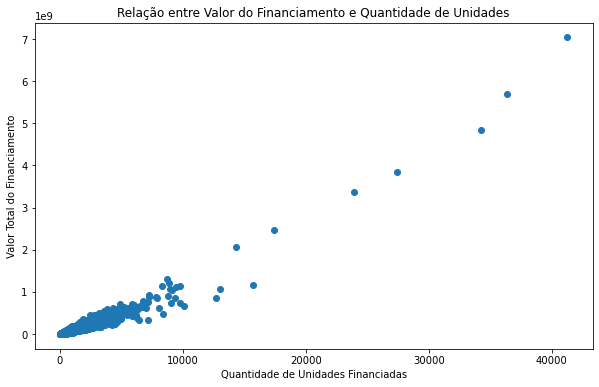

In [45]:
# 3. Análise do Financiamento: Relação entre Valor do Financiamento e Quantidade de Unidades

# Criar um gráfico de dispersão
plt.figure(figsize=(10, 6))
plt.scatter(df['qtd_uh_financiadas'], df['vlr_financiamento'])
plt.xlabel('Quantidade de Unidades Financiadas')
plt.ylabel('Valor Total do Financiamento')
plt.title('Relação entre Valor do Financiamento e Quantidade de Unidades')
plt.show()

In [52]:
# Agrupar por estado e somar o número de unidades financiadas
unidades_por_estado = df.groupby('txt_uf')['qtd_uh_financiadas'].sum().sort_values(ascending=False)

# Filtrar para os 10 estados com maior número de unidades financiadas
unidades_por_estado_top10 = unidades_por_estado.head(10)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=unidades_por_estado_top10.index,
    y=unidades_por_estado_top10.values,
    labels={"x": "Estado", "y": "Número de Unidades Financiadas"},
    title="Top 10 Estados com Maior Número de Unidades Financiadas",
)
fig.show()

In [53]:
# Agrupar por estado e somar o número de unidades financiadas
unidades_por_estado = df.groupby('txt_uf')['qtd_uh_financiadas'].sum().sort_values(ascending=True)

# Filtrar para os 10 estados com menor número de unidades financiadas
unidades_por_estado_bottom10 = unidades_por_estado.head(10)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=unidades_por_estado_bottom10.index,
    y=unidades_por_estado_bottom10.values,
    labels={"x": "Estado", "y": "Número de Unidades Financiadas"},
    title="10 Estados com Menor Número de Unidades Financiadas",
)
fig.show()

In [54]:
# Agrupar por município e somar a quantidade de unidades financiadas
unidades_por_municipio = df.groupby('txt_municipio')['qtd_uh_financiadas'].sum().sort_values(ascending=False)

# Filtrar para os 20 municípios com maior número de unidades financiadas
unidades_por_municipio_top20 = unidades_por_municipio.head(20)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=unidades_por_municipio_top20.index,
    y=unidades_por_municipio_top20.values,
    labels={"x": "Município", "y": "Número de Unidades Financiadas"},
    title="Top 20 Municípios com Maior Número de Unidades Financiadas",
)
fig.show()

In [57]:
# Agrupar por município e somar a quantidade de unidades financiadas
unidades_por_municipio = df.groupby('txt_municipio')['qtd_uh_financiadas'].sum().sort_values(ascending=True)

# Filtrar para os 20 municípios com menor número de unidades financiadas
unidades_por_municipio_bottom20 = unidades_por_municipio.head(20)

# Criar um gráfico de barras com Plotly
fig = px.scatter(
    x=unidades_por_municipio_bottom20.index,
    y=unidades_por_municipio_bottom20.values,
    labels={"x": "Município", "y": "Número de Unidades Financiadas"},
    title="20 Municípios com Menor Número de Unidades Financiadas",
)
fig.show()

In [58]:
# Agrupar por UF e somar o valor do subsídio
subsidio_por_estado = df.groupby('txt_uf')['vlr_subsidio'].sum().sort_values(ascending=False)

# Filtrar para os 10 estados com maior valor de subsídio
subsidio_por_estado_top10 = subsidio_por_estado.head(10)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=subsidio_por_estado_top10.index,
    y=subsidio_por_estado_top10.values,
    labels={"x": "Estado", "y": "Valor Total de Subsídio"},
    title="Top 10 Estados com Maior Valor Total de Subsídio",
)
fig.show()

In [60]:
# Agrupar por UF e somar o valor do subsídio
subsidio_por_estado = df.groupby('txt_uf')['vlr_subsidio'].sum().sort_values(ascending=True)

# Filtrar para os 10 estados com menor valor de subsídio
subsidio_por_estado_bottom10 = subsidio_por_estado.head(10)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=subsidio_por_estado_bottom10.index,
    y=subsidio_por_estado_bottom10.values,
    labels={"x": "Estado", "y": "Valor Total de Subsídio"},
    title="10 Estados com Menor Valor Total de Subsídio",
)
fig.show()

In [61]:
# Agrupar por município e somar o valor do subsídio
subsidio_por_municipio = df.groupby('txt_municipio')['vlr_subsidio'].sum().sort_values(ascending=False)

# Filtrar para as 20 cidades com maior valor de subsídio
subsidio_por_municipio_top20 = subsidio_por_municipio.head(20)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=subsidio_por_municipio_top20.index,
    y=subsidio_por_municipio_top20.values,
    labels={"x": "Município", "y": "Valor Total de Subsídio"},
    title="Top 20 Municípios com Maior Valor Total de Subsídio",
)
fig.show()

In [63]:
# Agrupar por município e somar o valor do subsídio
subsidio_por_municipio = df.groupby('txt_municipio')['vlr_subsidio'].sum()

# Remover valores nulos, 0 e em branco
subsidio_por_municipio = subsidio_por_municipio[subsidio_por_municipio.notna() & (subsidio_por_municipio != 0) & (subsidio_por_municipio.astype(str).str.strip() != '')]

# Ordenar em ordem crescente
subsidio_por_municipio = subsidio_por_municipio.sort_values(ascending=True)

# Filtrar para as 20 cidades com menor valor de subsídio (sem nulos, 0 e em branco)
subsidio_por_municipio_bottom20 = subsidio_por_municipio.head(20)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=subsidio_por_municipio_bottom20.index,
    y=subsidio_por_municipio_bottom20.values,
    labels={"x": "Município", "y": "Valor Total de Subsídio"},
    title="20 Municípios com Menor Valor Total de Subsídio (Excluindo Nulos, 0 e Brancos)",
)
fig.show()

### Insights:
- Proporção de Financiamentos: A proporção de financiamentos na Baixada Santista em relação ao total pode indicar a concentração de investimentos na região.
- Valor Médio de Financiamento: A comparação do valor médio de financiamento entre as regiões pode indicar diferenças no tipo de unidades financiadas (tamanho, tipo de imóvel, etc.) ou na capacidade de pagamento dos beneficiários.
- Análise do Subsídio: A comparação do valor total e da média do subsídio pode indicar diferenças na política de subsídios e na necessidade de recursos para financiar unidades habitacionais em cada região.
- Análise Temporal: A comparação da evolução do número de unidades financiadas pode indicar diferenças no ritmo de investimento e na demanda por unidades habitacionais em cada região.

#### O código acima gera 4 gráficos que comparam as informações da Baixada Santista com o DataFrame geral:

- Proporção de Financiamentos por Estado: Um gráfico de barras que compara a proporção de financiamentos por estado na Baixada Santista com a proporção geral.
- Valor Médio de Financiamento por Município: Um gráfico de barras que compara a média do valor de financiamento por município na Baixada Santista com a média geral.
- Análise do Subsídio: Um gráfico de barras que compara a média do subsídio por unidade financiada na Baixada Santista com a média geral.
- Análise Temporal: Um gráfico de linhas que compara a evolução do número de unidades financiadas ao longo dos anos na Baixada Santista com a evolução geral.

In [65]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Carregar os DataFrames (substitua 'dados_financiamento.csv' pelo nome do seu arquivo)
#df = pd.read_csv('dados_financiamento.csv')
df_baixada = df[df['txt_municipio'].isin(['Santos', 'Guarujá', 'Cubatão', 'Bertioga', 'Mongaguá', 'Itanhaém', 'Peruíbe'])]

# --- Proporção de Financiamentos por Estado ---

# Calcular proporção por estado na Baixada Santista
proporcao_estado_baixada = df_baixada.groupby('txt_uf')['qtd_uh_financiadas'].sum() / len(df_baixada) * 100
# Calcular proporção por estado geral
proporcao_estado_geral = df.groupby('txt_uf')['qtd_uh_financiadas'].sum() / len(df) * 100

# Criar o gráfico de barras
fig_proporcao = px.bar(
    x=proporcao_estado_baixada.index,
    y=[proporcao_estado_baixada.values, proporcao_estado_geral.values],
    barmode='group',
    labels={"x": "Estado", "y": "Proporção de Financiamentos (%)"},
    title="Proporção de Financiamentos por Estado - Baixada Santista vs Geral",
)
fig_proporcao.update_traces(name='Baixada Santista', selector=dict(name='0'))
fig_proporcao.update_traces(name='Geral', selector=dict(name='1'))
fig_proporcao.update_layout(xaxis_tickangle=-45)
fig_proporcao.show()

# --- Valor Médio de Financiamento por Município ---

# Calcular média por município na Baixada Santista
media_municipio_baixada = df_baixada.groupby('txt_municipio')['vlr_financiamento'].mean()
# Calcular média por município geral
media_municipio_geral = df.groupby('txt_municipio')['vlr_financiamento'].mean()

# Criar o gráfico de barras
fig_media = px.bar(
    x=media_municipio_baixada.index,
    y=[media_municipio_baixada.values, media_municipio_geral.values],
    barmode='group',
    labels={"x": "Município", "y": "Valor Médio de Financiamento"},
    title="Média do Valor de Financiamento por Município - Baixada Santista vs Geral",
)
fig_media.update_traces(name='Baixada Santista', selector=dict(name='0'))
fig_media.update_traces(name='Geral', selector=dict(name='1'))
fig_media.update_layout(xaxis_tickangle=-45)
fig_media.show()

# --- Análise do Subsídio ---

# Calcular média do subsídio por unidade financiada na Baixada Santista
media_subsidio_baixada = df_baixada['vlr_subsidio'].sum() / df_baixada['qtd_uh_financiadas'].sum()
# Calcular média do subsídio por unidade financiada geral
media_subsidio_geral = df['vlr_subsidio'].sum() / df['qtd_uh_financiadas'].sum()

# Criar gráfico de barras
fig_subsidio = go.Figure(data=[
    go.Bar(name='Baixada Santista', x=['Baixada Santista'], y=[media_subsidio_baixada]),
    go.Bar(name='Geral', x=['Geral'], y=[media_subsidio_geral])
])
fig_subsidio.update_layout(
    title="Média do Subsídio por Unidade Financiada - Baixada Santista vs Geral",
    xaxis_title="",
    yaxis_title="Valor Médio de Subsídio",
)
fig_subsidio.show()

# --- Análise Temporal ---

# Agrupar por ano e calcular o número total de unidades financiadas por ano
unidades_por_ano_baixada = df_baixada.groupby('num_ano_financiamento')['qtd_uh_financiadas'].sum()
unidades_por_ano_geral = df.groupby('num_ano_financiamento')['qtd_uh_financiadas'].sum()

# Criar um gráfico de linhas
fig_temporal = px.line(
    x=unidades_por_ano_baixada.index,
    y=unidades_por_ano_baixada.values,
    labels={"x": "Ano", "y": "Número de Unidades Financiadas"},
    title="Evolução do Financiamento ao Longo dos Anos - Baixada Santista vs Geral",
)
fig_temporal.add_scatter(
    x=unidades_por_ano_geral.index,
    y=unidades_por_ano_geral.values,
    name="Geral",
)
fig_temporal.show()

ValueError: All arguments should have the same length. The length of argument `wide_variable_1` is 27, whereas the length of  previously-processed arguments ['x', 'wide_variable_0'] is 1

ValueError: All arguments should have the same length. The length of argument `wide_variable_1` is 27, whereas the length of  previously-processed arguments ['x', 'wide_variable_0'] is 1

In [69]:
# Agrupar por estado e somar o número de unidades financiadas
unidades_por_estado = df.groupby('txt_uf')['qtd_uh_financiadas'].sum().sort_values(ascending=True)

# Filtrar para os 10 estados com menor número de unidades financiadas
unidades_por_estado_bottom10 = unidades_por_estado.head(10)

# Criar um gráfico de barras com Plotly
fig = px.bar(
    x=unidades_por_estado_bottom10.index,
    y=unidades_por_estado_bottom10.values,
    labels={"x": "Estado", "y": "Número de Unidades Financiadas"},
    title="10 Estados com Menor Número de Unidades Financiadas",
)
fig.show()

In [70]:
# Agrupar por município e somar o valor de financiamento
df_agrupado = df.groupby('txt_municipio')['vlr_financiamento'].sum().reset_index()

# Ordenar por valor de financiamento em ordem decrescente
df_agrupado = df_agrupado.sort_values('vlr_financiamento', ascending=False)

# Filtrar para as top 20 cidades
df_top_20 = df_agrupado.head(20)

# Criar o gráfico de barras usando Plotly Express
fig = px.bar(df_top_20, x='txt_municipio', y='vlr_financiamento',
            title='Valor Total de Financiamento pelas 20 Cidades com Maior Valor',
            labels={'txt_municipio': 'Município', 'vlr_financiamento': 'Valor de Financiamento'})

# Ajustar a disposição das labels no eixo x para evitar sobreposição
fig.update_layout(xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()

In [71]:
# Agrupar por município e somar o valor de financiamento
df_agrupado = df.groupby('txt_municipio')['vlr_financiamento'].sum().reset_index()

# Ordenar por valor de financiamento em ordem crescente (para os menores valores)
df_agrupado = df_agrupado.sort_values('vlr_financiamento', ascending=True)

# Filtrar para as 20 cidades com menor valor de financiamento
df_bottom_20 = df_agrupado.head(20)

# Criar o gráfico de barras usando Plotly Express
fig = px.bar(df_bottom_20, x='txt_municipio', y='vlr_financiamento',
            title='Valor Total de Financiamento pelas 20 Cidades com Menor Valor',
            labels={'txt_municipio': 'Município', 'vlr_financiamento': 'Valor de Financiamento'})

# Ajustar a disposição das labels no eixo x para evitar sobreposição
fig.update_layout(xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()

In [73]:
import pandas as pd
import plotly.express as px

# Carregar o DataFrame (substitua 'dados_financiamento.csv' pelo nome do seu arquivo)
#df = pd.read_csv('dados_financiamento.csv')

# Filtrar o DataFrame para incluir apenas as cidades da Baixada Santista
cidades_baixada = ['Santos', 'Guarujá', 'Cubatão', 'Bertioga', 'Mongaguá', 'Itanhaém', 'Peruíbe']
df_baixada = df[df['txt_municipio'].isin(cidades_baixada)]

# Agrupar por ano e calcular o total de financiamento e subsídio
df_agrupado_baixada = df_baixada.groupby('num_ano_financiamento').agg(
    total_financiamento=('vlr_financiamento', 'sum'),
    total_subsidio=('vlr_subsidio', 'sum')
).reset_index()

# Criar o gráfico de linhas
fig = px.line(
    df_agrupado_baixada,
    x='num_ano_financiamento',
    y=['total_financiamento', 'total_subsidio'],
    labels={"num_ano_financiamento": "Ano", "value": "Valor (R$)"},
    title="Evolução do Financiamento e Subsídio na Baixada Santista",
)
fig.show()

In [77]:
# Lista de cidades da Baixada Santista
cidades_baixada = ['Santos', 'Guarujá', 'Cubatão', 'Bertioga', 'Mongaguá', 'Itanhaém', 'Peruíbe']

# Filtrar o DataFrame para incluir apenas as cidades da Baixada Santista
df_baixada = df[df['txt_municipio'].isin(cidades_baixada)]

# Agrupar por município e somar o valor de financiamento
df_agrupado_baixada = df_baixada.groupby('txt_municipio')['vlr_financiamento'].sum().reset_index()

# Criar o gráfico de barras usando Plotly Express
fig = px.bar(df_agrupado_baixada, x='txt_municipio', y='vlr_financiamento',
            title='Valor Total de Financiamento na Baixada Santista',
            color_discrete_sequence=['#0A6847'],
            labels={'txt_municipio': 'Município', 'vlr_financiamento': 'Valor de Financiamento'})
            
# Ajustar a disposição das labels no eixo x para evitar sobreposição
fig.update_layout(xaxis_tickangle=-45)

# Atualizar o layout para definir o fundo e a cor das fontes
fig.update_layout(
    plot_bgcolor="#F1F1F1",  # Cor de fundo do gráfico
    paper_bgcolor="#F1F1F1",  # Cor de fundo do papel
    font=dict(
        family="Arial",  # Você pode definir uma outra fonte
        size=12,  # Tamanho da fonte
        color="black"  # Cor da fonte em preto
    )
)

# Mostrar o gráfico
fig.show()